### Цели и задачи проекта  Credit Scoring
Суть проекта — построить скоринг модель для вторичных клиентов банка, которая бы предсказывала вероятность дефолта клиента.
Результаты оцениваются по площади под кривой ROC AUC.

#### Import Libraries

In [3]:
import numpy as np  # linear algebra
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
from itertools import combinations

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, precision_score, accuracy_score, average_precision_score
from sklearn.metrics import f1_score, mean_squared_error, recall_score, log_loss, brier_score_loss
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

from scipy.stats import ttest_ind

%matplotlib inline

In [4]:
import pandas_profiling

%matplotlib inline

#### Declare constants

In [5]:
DATA_DIR = "D://"  # directory with data
RANDOM_SEED = 42 # fix random
TEST_SIZE = 0.3 # size test data
MAX_ITER = 1000 # iterations count

### Data structure

**client_id** - идентификатор клиента  
**education** - уровень образования  
**sex** - пол заемщика  
**age** - возраст заемщика  
**car** - флаг наличия автомобиля  
**car_type** - флаг автомобиля иномарки  
**decline_app_cnt** - количество отказанных прошлых заявок  
**good_work** - флаг наличия “хорошей” работы  
**bki_request_cnt** - количество запросов в БКИ  
**home_address** - категоризатор домашнего адреса  
**work_address** - категоризатор рабочего адреса  
**income** - доход заемщика  
**foreign_passport** - наличие загранпаспорта  
**sna** - связь заемщика с клиентами банка  
**first_time** - давность наличия информации о заемщике  
**score_bki** - скоринговый балл по данным из БКИ  
**region_rating** - рейтинг региона  
**app_date** - дата подачи заявки  
**default** - флаг дефолта по кредиту  

### Declare classes

In [6]:
# DataAnalysis class provides a list of methods for data analysis
class DataAnalysis():

    def __init__(self, data, description):
        self.data = data  # data for analysis
        self.description = description  # brief data description

    # provide info about data
    def basic_info(self):
        self.display("Preview")
        display(self.data.sample(5))  # data preview

        self.display("Info")
        self.data.info()  # data info

        print('\n')
        print('Shape: {}'.format(self.data.shape))

        for column in self.data.columns:
            self.null_values_info(column)

    # do primary data analysis
    def primary_analysis(self):
        display(pandas_profiling.ProfileReport(self.data))

    # get info about column with null values
    def null_info(self, column):
        display(self.data[column].value_counts(dropna=False))
        mode = self.data[column].mode()[0]
        print('{} mode is \033[1m{}\033[0m'.format(column, mode))

    # get percent of null values in column
    def null_values_info(self, column):
        nanPercent = len(self.data[self.data[column].isnull()])/len(self.data)
        print('Percent nullable records in \033[1m{}\033[0m column: {:2.1%}'.format(
            column, nanPercent))
        return nanPercent

    # get outliers info
    def outlier_info(self, column):
        IQR = self.data[column].quantile(
            0.75) - self.data[column].quantile(0.25)
        perc25 = self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)

        ds = self.data.loc[self.data[column].between(
            perc25 - 1.5*IQR, perc75 + 1.5*IQR)]
        totalCount = len(self.data)
        outlierCount = totalCount - len(ds)

        print('\033[1mCOLUMN: {} \033[0m'.format(column))
        print('25%: {}.'.format(perc25))
        print('75%: {}.'.format(perc75))
        print('IQR: {}.'.format(IQR))
        print('Outlier ranges: [{f}, {l}].'.format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR))
        print('\033[1mOutlier count: {} from {} ({:.0%}).\033[0m'.format(
            outlierCount, totalCount, outlierCount/totalCount))
        print('\n')

    # do variance analysis for numeric variables
    def numeric_variance_analysis(self, columns):
        imp_num = pd.Series(
            f_classif(self.data[columns], self.data['default'])[0], index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # do variance analysis for string variables
    def variance_analysis(self, columns):
        imp_num = pd.Series(mutual_info_classif(self.data[columns], self.data['default'],
                                                discrete_features=True), index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # Student test
    def get_stat_dif(self, columns):
        for column in columns:
            cols = self.data.loc[:, column].value_counts().index[:10]
            combinations_all = list(combinations(cols, 2))

            if len(combinations_all) == 0:
                break

            for comb in combinations_all:
                if ttest_ind(self.data.loc[df.loc[:, column] == comb[0], 'default'],
                             self.data.loc[df.loc[:, column] == comb[1], 'default']). pvalue\
                        <= 0.1/len(combinations_all):
                    print('Exist stat significant differences for column ', column)
                    break

    # print text
    def display(self, text):
        print('\033[1m--- {}: {} ---\033[0m'.format(self.description.upper(), text))

In [7]:
# DataProcessing class provides a list of methods for data preprocessing
class DataProcessing():
    def __init__(self, data):
        self.data = data  # data for preprocessing

    # replace null values in column
    def fillna(self, column, value):
        self.data[column].fillna(value, inplace=True)

    # replace outlets with top quantile
    def outlets_resolve(self, column):  # quant=0.25 or 0.75
        IQR = self.data[column].quantile(
            q=0.75) - self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)
        high_border = perc75 + 1.5*IQR
        self.data[column] = self.data[column].apply(
            lambda x: high_border if x > high_border else x)

    # log transformation
    def log_transform(self, columns):
        for column in columns:
            self.data[column] = self.data[column].apply(lambda x: np.log(x+1))
            plt.figure()
            sns.histplot(self.data[column], kde=True,
                         stat="density", linewidth=0)

    # date processing
    def date_process(self, column):
        # convert to datetime
        self.data[column] = pd.to_datetime(self.data[column])

        # feature engineering
        self.data[column + '_year'] = self.data[column].apply(lambda x: x.year)
        self.data[column +
                  '_month'] = self.data[column].apply(lambda x: x.month)
        self.data[column + '_day'] = self.data[column].apply(lambda x: x.day)

        # drop original column
        self.data.drop([column], axis=1, inplace=True)

    # standard scaler for numeric variables
    def standard_scale(self, columns):
        self.data[columns] = pd.DataFrame(
            StandardScaler().fit_transform(self.data[columns]), columns=columns)
        for column in columns:
            plt.figure()
            sns.histplot(self.data[column], kde=True,
                         stat="density", linewidth=0)

    # label encoder for string variables
    def label_encode(self, columns):
        for column in columns:
            self.data[column] = LabelEncoder().fit_transform(self.data[column])

    # ordinal encoder for string variables
    def ordinal_encode(self, columns):
        self.data[columns] = OrdinalEncoder().fit_transform(
            self.data[columns]).astype(int)

    # get dummies data
    def get_dummies(self, columns):
        return pd.get_dummies(self.data, columns=columns)

In [8]:
# Model Runner class provides a list of methods for modeling
class ModelRunner():

    def __init__(self, data, is_train):
        df = data.copy()

        if is_train == True:
            df = df.query('sample == 1').drop(['sample'], axis=1)
        else: 
            df = df.query('sample == 0').drop(['sample'], axis=1)
        
        x = df.drop(['client_id', 'default'], axis=1)
        y = df['default']

        self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(
            x, y, test_size=TEST_SIZE, random_state=RANDOM_SEED)
        self.y_pred = 0

    # train model with logistic_regression

    def logistic_regression(self):
        model = LogisticRegression(max_iter=MAX_ITER)
        model.fit(self.x_train, self.y_train)
        self.y_pred = model.predict(self.x_test)
        self.probs = model.predict_proba(self.x_test)
        self.prob = self.probs[:, 1]
        self.show_results(model, 'Logistic Regression')
        return model

    # train model with logistic_regression hyper parameters
    def logistic_regression_hyperparams(self):

        # regulation types
        penalty = ['l1']

        # set limit for regulation parameters
        c = np.logspace(0, 100, 5)

        # set hyperparameters
        hyperparameters = dict(C=c, penalty=penalty)

        self.model = LogisticRegression(C=1, penalty='l1', solver='liblinear')
        self.model.fit(self.x_train, self.y_train)

        clf = GridSearchCV(model, hyperparameters, cv=5, verbose=0)
        best_model = clf.fit(self.x_train, self.y_train)

        self.prob = best_model.predict_proba(self.x_test)[:, 1]
        self.y_pred = best_model.predict(self.x_test)
        self.show_results(best_model, 'Logistic Regression Hyperparams')
        return best_model

    # train model with logistic_regression hyper parameters

    def logistic_regression_catboost(self):
        model = CatBoostClassifier(
            n_estimators=MAX_ITER, depth=2, logging_level='Silent')
        model.fit(self.x_train, self.y_train)

        self.prob = model.predict_proba(self.x_test)[:, 1]
        self.y_pred = model.predict(self.x_test)
        self.show_results(model, 'Logistic Regression CatBoost')

    # show results
    def show_results(self, model, title):
        fpr, tpr, threshold = roc_curve(self.y_test, self.prob)
        roc_auc = roc_auc_score(self.y_test, self.prob)

        print('\033[1mMODEL: {} \033[0m'.format(title))
        print("f1_score:", round(f1_score(self.y_test, self.y_pred), 3))
        print("accuracy_score:", round(
            accuracy_score(self.y_test, self.y_pred), 3))
        print("precision_score:", round(
            precision_score(self.y_test, self.y_pred), 3))
        print("recall_score:", round(recall_score(self.y_test, self.y_pred), 3))
        print("log_loss:", round(log_loss(self.y_test, self.y_pred), 3))
        print("roc_auc_score:", round(roc_auc, 3))
        print("average_precision_score:", round(
            average_precision_score(self.y_test, self.y_pred), 3))
        print("brier_score_loss:", round(
            brier_score_loss(self.y_test, self.y_pred), 3))

        plt.figure()
        plt.plot([0, 1], label='Baseline', linestyle='--')
        plt.plot(fpr, tpr, label=title)
        plt.title(title + ' ROC AUC = %0.3f' % roc_auc)
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc='lower right')
        plt.show()

        self.conf_matrix(model)
        # print('Confusion matrix:\n{}' .format(confusion_matrix(self.y_test,self.y_pred)))

    def conf_matrix(self, model):
        sns.set_context(context='paper', font_scale=2, rc=None)
        group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
        group_counts = ['{0:0.0f}'.format(value) for value in confusion_matrix(
            self.y_test, self.y_pred).flatten()]

        labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names, group_counts)]
        labels = np.asarray(labels).reshape(2, 2)
        sns.heatmap(confusion_matrix(self.y_test, self.y_pred),
                    annot=labels, fmt='', cmap='Blues')
        plt.show()

### 1. EDA - Data Analysis

#### 1.1 Load data 

In [9]:
data_train = pd.read_csv(DATA_DIR + 'train.csv')  # train data
data_test = pd.read_csv(DATA_DIR + 'test.csv')  # test data
# sample_submission data / results
data_sample_submission = pd.read_csv(DATA_DIR + 'sample_submission.csv')

#### 1.2 Basic info

In [10]:
eda_train = DataAnalysis(data_train, 'train data')
eda_train.basic_info()

--- TRAIN DATA: Preview ---


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
64747,11354,18JAN2014,SCH,F,38,N,N,0,0,-2.884946,2,50,1,2,17000,3,3,N,0
61757,8119,15JAN2014,SCH,F,26,N,N,0,0,-2.225004,3,50,2,3,15000,1,3,N,0
26112,30766,06FEB2014,SCH,M,32,Y,N,0,1,-1.833569,3,40,1,2,30000,1,3,N,0
31863,47272,24FEB2014,SCH,F,63,N,N,0,0,-2.711172,1,40,2,3,25000,1,3,N,0
25096,52360,01MAR2014,SCH,F,56,N,N,0,0,-1.190402,1,50,1,2,40000,4,1,N,0


--- TRAIN DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time     

In [11]:
eda_test = DataAnalysis(data_test, 'test data')
eda_test.basic_info()

--- TEST DATA: Preview ---


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport
31769,6392,13JAN2014,SCH,F,55,N,N,0,0,-1.687917,0,50,2,3,7000,4,1,N
12099,73976,21MAR2014,UGR,M,28,N,N,0,0,-1.775263,1,50,2,3,37000,4,1,N
730,88165,04APR2014,GRD,F,25,N,N,0,1,-1.290966,3,40,2,3,25000,2,2,N
7482,98130,15APR2014,SCH,M,60,N,N,0,0,-2.051516,6,40,2,3,13000,1,4,N
35155,68366,17MAR2014,GRD,F,36,N,N,0,0,-1.211017,0,60,1,2,40000,1,3,N


--- TEST DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36349 entries, 0 to 36348
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         36349 non-null  int64  
 1   app_date          36349 non-null  object 
 2   education         36178 non-null  object 
 3   sex               36349 non-null  object 
 4   age               36349 non-null  int64  
 5   car               36349 non-null  object 
 6   car_type          36349 non-null  object 
 7   decline_app_cnt   36349 non-null  int64  
 8   good_work         36349 non-null  int64  
 9   score_bki         36349 non-null  float64
 10  bki_request_cnt   36349 non-null  int64  
 11  region_rating     36349 non-null  int64  
 12  home_address      36349 non-null  int64  
 13  work_address      36349 non-null  int64  
 14  income            36349 non-null  int64  
 15  sna               36349 non-null  int64  
 16  first_time      

In [12]:
eda_sample_submission = DataAnalysis(
    data_sample_submission, 'sample_submission')
eda_sample_submission.basic_info()

--- SAMPLE_SUBMISSION: Preview ---


,client_id,default
18620,95565,0.158490
13739,89494,0.095921
4295,37650,0.185987
14762,12844,0.046625
4408,27789,0.824556


--- SAMPLE_SUBMISSION: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24354 entries, 0 to 24353
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   client_id  24354 non-null  int64  
 1   default    24354 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 380.7 KB


Shape: (24354, 2)
Percent nullable records in client_id column: 0.0%
Percent nullable records in default column: 0.0%


**SUMMARY:**    
1 Datasets **train** and **test** are pretty identical, except of **default** column, that is presented in **train** dataset only. They can be united to simplify future analysis.  
2 Only **education** column has null values.

#### 1.3 Combine can train and test datasets

In [13]:
# Combine can train and test datasets to simplify future analysis.
data_train['sample'] = 1  # train flag
data_test['sample'] = 0  # test flag
data_test['default'] = 0  # as it is missed in the test dataset

data_combined = data_test.append(data_train, sort=False).reset_index(drop=True)
data = data_combined.copy()

eda = DataAnalysis(data, 'data')
eda.basic_info()

--- DATA: Preview ---


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
32220,23674,30JAN2014,GRD,F,49,Y,N,0,1,-0.979308,23,80,2,3,45000,1,2,N,0,0
94424,13190,20JAN2014,SCH,F,35,N,N,0,0,-1.774093,2,30,2,3,11000,1,3,N,1,0
15713,75475,23MAR2014,SCH,F,27,N,N,0,0,-1.680313,1,40,1,2,38000,3,1,N,0,0
63894,100620,17APR2014,SCH,F,52,N,N,0,1,-1.491976,3,50,2,3,9000,1,4,N,1,0
71229,79758,27MAR2014,UGR,F,48,Y,N,0,0,-1.540686,3,50,2,3,18000,1,3,N,1,1


--- DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   client_id         110148 non-null  int64  
 1   app_date          110148 non-null  object 
 2   education         109670 non-null  object 
 3   sex               110148 non-null  object 
 4   age               110148 non-null  int64  
 5   car               110148 non-null  object 
 6   car_type          110148 non-null  object 
 7   decline_app_cnt   110148 non-null  int64  
 8   good_work         110148 non-null  int64  
 9   score_bki         110148 non-null  float64
 10  bki_request_cnt   110148 non-null  int64  
 11  region_rating     110148 non-null  int64  
 12  home_address      110148 non-null  int64  
 13  work_address      110148 non-null  int64  
 14  income            110148 non-null  int64  
 15  sna               110148 non-null  int64  
 16  f

#### 1.4 Primary data analysis

In [12]:
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**SUMMARY: Primary Data Analysis**    
1 The dataset contains: 7 - numeric, 10 - categorical and 3 - boolean variables   
2 There is no duplicates in the dataset  
3 Only Education contains null values  
4 Clients **with default** 10 times more than clients **without default**  
5 Histograms for numeric variables (**age**, **decline_app_cnt**, **income**, **bki_request_cnt**) shifted left. **Normalization can help.**  
6 Low corellation of **default** with other variables  
7 High corellation between **income** and **region_rating** variables

##### 1.5  Split columns by types

In [14]:
bin_columns = ['sex', 'car', 'car_type',
               'foreign_passport', 'good_work']  # binary variables
cat_columns = ['education', 'region_rating', 'home_address',
               'work_address', 'app_date', 'sna', 'first_time']  # categorical variables
num_columns = ['age', 'decline_app_cnt', 'income',
               'bki_request_cnt', 'score_bki']  # numeric variables

##### 1.6 NULL analysis

In [15]:
eda.null_info('education')

SCH    57998
GRD    34768
UGR    14748
PGR     1865
NaN      478
ACD      291
Name: education, dtype: int64

education mode is SCH


**TODO**: replace with the most frequent one.

##### 1.7 Outliers analysis

In [16]:
for column in num_columns:
    eda.outlier_info(column)

COLUMN: age 
25%: 30.0.
75%: 48.0.
IQR: 18.0.
Outlier ranges: [3.0, 75.0].
Outlier count: 0 from 110148 (0%).


COLUMN: decline_app_cnt 
25%: 0.0.
75%: 0.0.
IQR: 0.0.
Outlier ranges: [0.0, 0.0].
Outlier count: 18677 from 110148 (17%).


COLUMN: income 
25%: 20000.0.
75%: 48000.0.
IQR: 28000.0.
Outlier ranges: [-22000.0, 90000.0].
Outlier count: 7000 from 110148 (6%).


COLUMN: bki_request_cnt 
25%: 0.0.
75%: 3.0.
IQR: 3.0.
Outlier ranges: [-4.5, 7.5].
Outlier count: 2636 from 110148 (2%).


COLUMN: score_bki 
25%: -2.2604336700000003.
75%: -1.5678881525.
IQR: 0.6925455175000004.
Outlier ranges: [-3.299251946250001, -0.5290698762499992].
Outlier count: 518 from 110148 (0%).




**RESULT:**  
Outliers have been found in **decline_app_cnt**, **income**, **bki_request_cnt**, **score_bki** columns.

##### **1.8 Numeric: correlation analysis**

<AxesSubplot:>

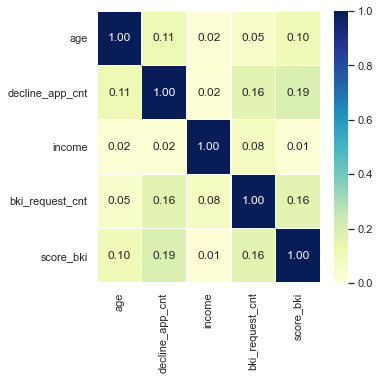

In [17]:
sns.set(font_scale=1)
fig, axis = plt.subplots(figsize=(5, 5))
sns.heatmap(data[num_columns].corr().abs(), vmin=0, vmax=1,
            annot=True, fmt=".2f", linewidths=0.1, cmap="YlGnBu")

**RESULT:**  
There are no strong correlation between numeric variables.

###### **1.9 Numeric: variance analysis**

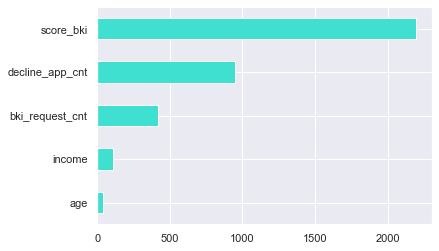

In [18]:
eda.numeric_variance_analysis(num_columns)

**RESULT:**  
**score_bki** is the most significant numeric variable.

###### **1.10 Categorial & Binary: variance analysis**

In [19]:
df = data.copy()
dp = DataProcessing(df)

columns = bin_columns.copy()
columns.append('education')

dp.fillna('education', 'SCH')
dp.label_encode(columns)

df.sample(5)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
24685,78877,27MAR2014,3,0,28,1,0,0,0,-1.071462,0,50,1,3,25000,1,3,1,0,0
47659,55010,04MAR2014,3,0,43,0,0,0,0,-1.339376,1,50,2,3,7000,4,2,0,1,0
77158,14908,22JAN2014,3,0,57,0,0,0,0,-2.602728,1,60,2,3,12000,1,2,0,1,1
55664,28633,04FEB2014,3,0,39,0,0,0,0,-1.558327,1,50,2,3,12000,4,1,0,1,0
61696,5075,11JAN2014,3,0,21,0,0,0,0,-2.255318,1,80,2,3,25000,1,3,0,1,0


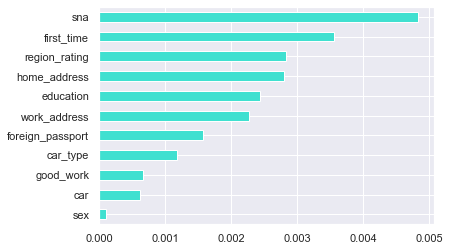

In [20]:
columns = bin_columns + cat_columns;
columns.remove('app_date')

da = DataAnalysis(df, 'data')
da.variance_analysis(columns)

**RESULT:**  
**sna** is the most significant variable for binary and categorial variables.

## 2. Trainings

### Model 1: Native

In [21]:
train1 = data.copy()
train1.dropna(inplace=True)  # delete nulls
train1.drop(['app_date'], axis=1, inplace=True)

dp = DataProcessing(train1)
dp.ordinal_encode(train1.select_dtypes(include=['object']).columns)

train1.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
28440,74547,3,0,40,0,0,0,0,-2.532035,0,40,2,3,13000,1,4,0,0,0
26192,39109,1,0,29,1,0,0,1,-1.060929,2,50,1,2,45000,1,3,0,0,0
97088,20093,4,1,28,0,0,3,0,-1.892502,0,50,2,3,30000,1,4,0,1,0


MODEL: Logistic Regression 
f1_score: 0.023
accuracy_score: 0.872
precision_score: 0.42
recall_score: 0.012
log_loss: 4.436
roc_auc_score: 0.66
average_precision_score: 0.131
brier_score_loss: 0.128


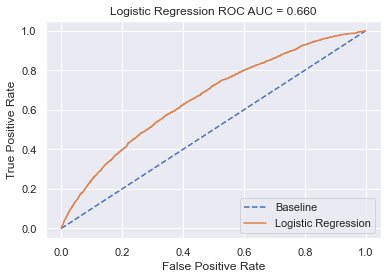

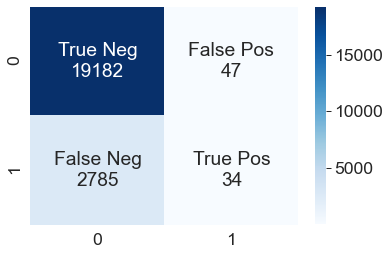

LogisticRegression(max_iter=1000)

In [22]:
ModelRunner(train1, True).logistic_regression()

**RESULT: MODEL 1**   
Unsatisfied. ROC AUC > 0.5, but it can be higher. TruePos is low.

### Model 2: NaN processing, Date parsing, Binary conversation

In [23]:
train2 = data.copy()
train2.sample(3)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
91337,41099,17FEB2014,GRD,F,29,Y,Y,1,0,-1.815433,1,50,1,2,100000,1,3,Y,1,0
21396,21378,28JAN2014,GRD,F,54,Y,N,0,0,-1.744840,10,60,1,2,30000,1,4,N,0,0
69427,52728,01MAR2014,SCH,M,39,Y,N,0,1,-2.019309,1,50,1,2,25000,2,2,N,1,1


In [24]:
# create data processing object
dp = DataProcessing(train2)

In [25]:
# replace null values in education column (see SUMMARY: Primary Data Analysis)
dp.fillna('education', 'SCH')

In [26]:
# transform app_date column
dp.date_process('app_date')

train2.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_year,app_date_month,app_date_day
72386,30393,UGR,F,21,N,N,1,0,-2.346099,1,...,2,15000,4,2,N,1,0,2014,2,6
6750,61766,UGR,F,30,Y,N,0,0,-2.124027,2,...,2,20000,2,3,N,0,0,2014,3,11
68899,89252,SCH,M,30,N,N,0,0,-1.063919,1,...,2,20000,1,4,N,1,0,2014,4,5


In [27]:
# conver binary columns to numeric
dp.label_encode(bin_columns)

train2.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_year,app_date_month,app_date_day
79873,96549,SCH,0,35,0,0,0,0,-2.119401,1,...,3,30000,3,1,0,1,0,2014,4,13
48601,37389,SCH,0,53,0,0,0,1,-1.927892,1,...,1,21000,1,4,0,1,0,2014,2,13
56357,86,GRD,1,57,0,0,0,0,-2.369194,1,...,2,30000,1,3,0,1,0,2014,1,2


In [28]:
# conver education column to numeric
dp.label_encode(['education'])

train2.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_year,app_date_month,app_date_day
55472,108725,1,0,38,0,0,0,1,-1.851545,2,...,3,32000,1,3,0,1,0,2014,4,28
65969,20361,4,0,36,0,0,0,0,-2.107666,1,...,1,38000,1,3,0,1,1,2014,1,27
93535,36720,3,1,31,1,0,1,0,-3.006112,1,...,3,35000,4,1,0,1,0,2014,2,12


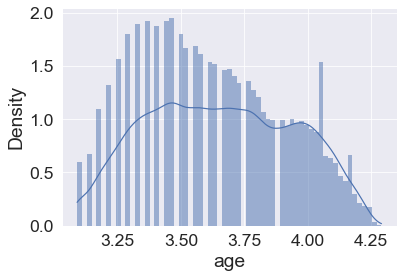

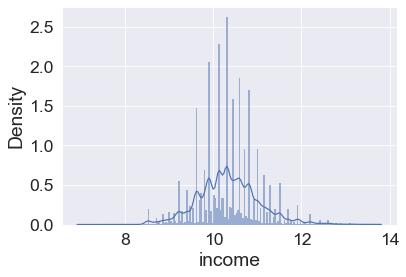

In [29]:
# apply log for shifed left columns (see SUMMARY: Primary Data Analysis)
columns = ['age', 'income']

dp.log_transform(columns)

MODEL: Logistic Regression 
f1_score: 0.04
accuracy_score: 0.873
precision_score: 0.383
recall_score: 0.021
log_loss: 4.393
roc_auc_score: 0.734
average_precision_score: 0.131
brier_score_loss: 0.127


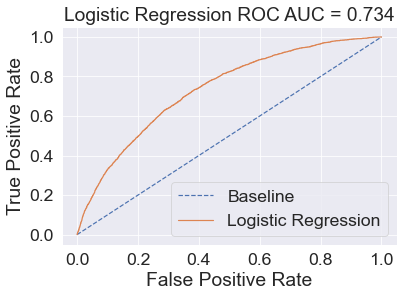

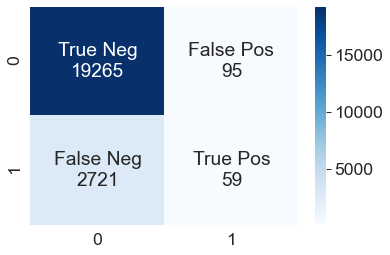

LogisticRegression(max_iter=1000)

In [30]:
# Train
ModelRunner(train2, True).logistic_regression()

**RESULT: MODEL 2**  
ROC AUT is bigger than in MODEL 1, but TruePost is still low. Continue with MODEL 2.

### Model 3: Outlets processing

In [31]:
train3 = train2.copy()

# create data processing object
dp = DataProcessing(train3)

In [32]:
# resolve outlets
dp.outlets_resolve('decline_app_cnt')
dp.outlets_resolve('bki_request_cnt')

MODEL: Logistic Regression 
f1_score: 0.031
accuracy_score: 0.874
precision_score: 0.413
recall_score: 0.016
log_loss: 4.366
roc_auc_score: 0.732
average_precision_score: 0.13
brier_score_loss: 0.126


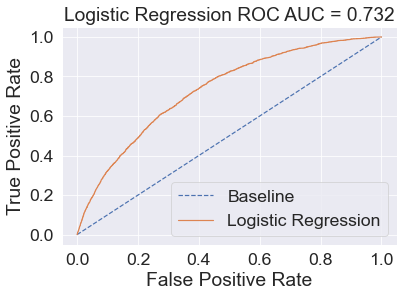

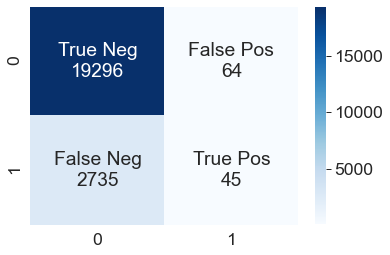

In [33]:
# Train
model = ModelRunner(train3, True).logistic_regression()

**RESULT: MODEL 3**  
Result is negative, ROC AUC and TruePos are lower than in MODEL 2. Continue with **MODEL 2**.

### Model 4: Resolve high correlation

In [34]:
train4 = train2.copy()

# create data processing object
dp = DataProcessing(train4)

train4.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_year,app_date_month,app_date_day
20228,84828,1,0,4.025352,0,0,0,0,-1.616620,3,...,3,10.308986,1,4,0,0,0,2014,4,1
31952,38722,3,1,3.871201,1,0,0,0,-2.016383,2,...,2,10.596660,1,4,0,0,0,2014,2,14
17124,104953,4,1,3.555348,1,1,0,0,-1.644116,2,...,3,11.002117,1,4,1,0,0,2014,4,23


In [35]:
eda4 = DataAnalysis(train4, 'data4')
eda4.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [36]:
# remove column with high correlation most used
train4 = train4.drop(['app_date_year'], axis=1)

train4.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,home_address,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_month,app_date_day
36942,48853,4,1,3.178054,0,0,1,1,-1.402843,1,...,1,3,10.596660,1,3,1,1,0,2,25
71837,28639,3,1,3.784190,1,0,0,0,-2.409446,4,...,1,2,11.156265,1,3,0,1,0,2,4
22804,20693,3,0,3.850148,0,0,0,0,-1.827013,2,...,1,2,9.210440,1,3,0,0,0,1,28


In [178]:
eda4.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

MODEL: Logistic Regression 
f1_score: 0.043
accuracy_score: 0.873
precision_score: 0.377
recall_score: 0.023
log_loss: 4.401
roc_auc_score: 0.734
average_precision_score: 0.131
brier_score_loss: 0.127


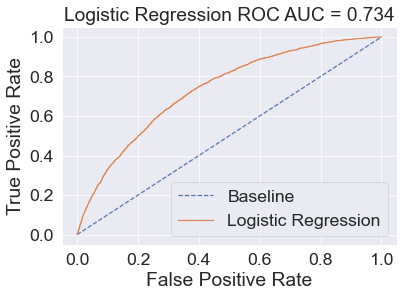

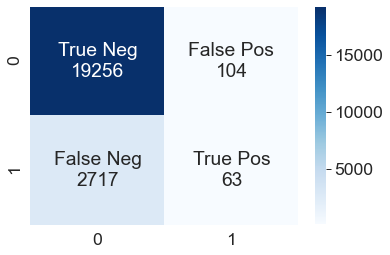

LogisticRegression(max_iter=1000)

In [37]:
# Train
ModelRunner(train4, True).logistic_regression()

**RESULT: MODEL 4**  
It is a bit better than MODEL 2. Let's use **MODEL 4** as a base next.

### Model 5: Dummies 

In [38]:
train5 = train4.copy()

# create data processing object
dp = DataProcessing(train5)

train5.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,home_address,work_address,income,sna,first_time,foreign_passport,sample,default,app_date_month,app_date_day
63313,48057,3,1,3.258097,0,0,0,1,-1.293432,1,...,2,3,10.463132,2,2,0,1,0,2,25
31092,63125,3,0,3.555348,0,0,0,0,-0.780682,0,...,3,3,9.903538,4,1,0,0,0,3,12
100468,35032,1,0,3.663562,0,0,0,0,-2.304026,5,...,1,2,10.126671,1,3,0,1,0,2,11


In [39]:
# generate dummy columns for sna
train5 = dp.get_dummies(['sna', 'first_time', 'region_rating', 'work_address', 'home_address'])

train5.sample(3)

,client_id,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,region_rating_50,region_rating_60,region_rating_70,region_rating_80,work_address_1,work_address_2,work_address_3,home_address_1,home_address_2,home_address_3
31723,53733,3,0,3.218876,1,0,0,0,-1.848455,0,...,0,0,1,0,0,0,1,0,1,0
693,37562,3,0,3.663562,0,0,1,0,-1.836875,1,...,0,1,0,0,0,0,1,1,0,0
11231,62235,1,1,3.526361,0,0,0,1,-1.690508,1,...,0,0,1,0,0,0,1,1,0,0


MODEL: Logistic Regression 
f1_score: 0.046
accuracy_score: 0.873
precision_score: 0.389
recall_score: 0.024
log_loss: 4.398
roc_auc_score: 0.738
average_precision_score: 0.132
brier_score_loss: 0.127


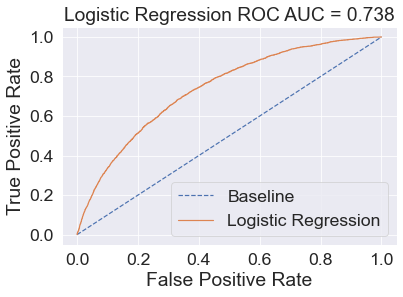

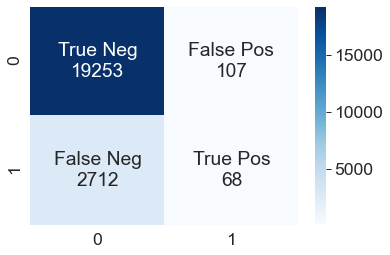

LogisticRegression(max_iter=1000)

In [40]:
# Train
ModelRunner(train5, True).logistic_regression()

**RESULT: MODEL 5**  
It is a bit better than MODEL 4. Let's use **MODEL 5** as a base next.  
A lot (2712) of false/neg resutls. A customers who can't return loan will get it.

#### Model 6: Model 5 - hyper parameters

In [2]:
# Train with hyperparams
ModelRunner(train,True).logistic_regression_hyperparams()

NameError: name 'ModelRunner' is not defined

**RESULT: MODEL 5**  
Need to try **undersampling** or more complex model **CatBoost**.

## 3. Submission

In [45]:
# Use Model 5 as the best
test = train5.query('sample == 0').drop(['sample'], axis=1)

MODEL: Logistic Regression 
f1_score: 0.046
accuracy_score: 0.873
precision_score: 0.389
recall_score: 0.024
log_loss: 4.398
roc_auc_score: 0.738
average_precision_score: 0.132
brier_score_loss: 0.127


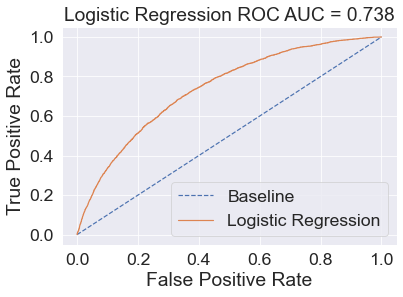

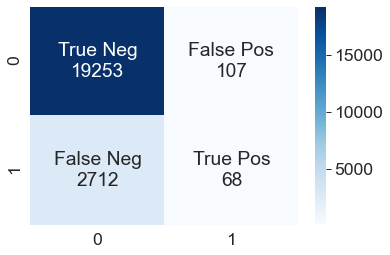

In [42]:
# Train Test model
model = ModelRunner(train5,True).logistic_regression()
x_test = test.drop(columns=['default', 'client_id'])
y_probs = model.predict_proba(x_test)[:,1]
test['default'] = y_probs

In [43]:
submission = test[['client_id','default']]
display(submission.sample(10))
display(submission.shape)

,client_id,default
30882,80888,0.120319
21888,90167,0.046282
8782,45173,0.090989
26340,57260,0.114081
35387,59123,0.213136
31803,49339,0.062947
28596,53301,0.039884
34894,104903,0.124776
437,10964,0.181657
17757,48768,0.204890


(36349, 2)

In [44]:
# save submission to file 
submission.to_csv(DATA_DIR + 'submission.csv', index=False)